In [1]:
import pandas as pd

df = pd.read_csv('../data/raw/winequality-red.csv')

df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [3]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [4]:
df.quantile(0.25)

fixed acidity            7.1000
volatile acidity         0.3900
citric acid              0.0900
residual sugar           1.9000
chlorides                0.0700
free sulfur dioxide      7.0000
total sulfur dioxide    22.0000
density                  0.9956
pH                       3.2100
sulphates                0.5500
alcohol                  9.5000
quality                  5.0000
Name: 0.25, dtype: float64

In [5]:
df.quantile(0.75)

fixed acidity            9.200000
volatile acidity         0.640000
citric acid              0.420000
residual sugar           2.600000
chlorides                0.090000
free sulfur dioxide     21.000000
total sulfur dioxide    62.000000
density                  0.997835
pH                       3.400000
sulphates                0.730000
alcohol                 11.100000
quality                  6.000000
Name: 0.75, dtype: float64

Text(0.5, 1.0, 'Распределение целевой переменной')

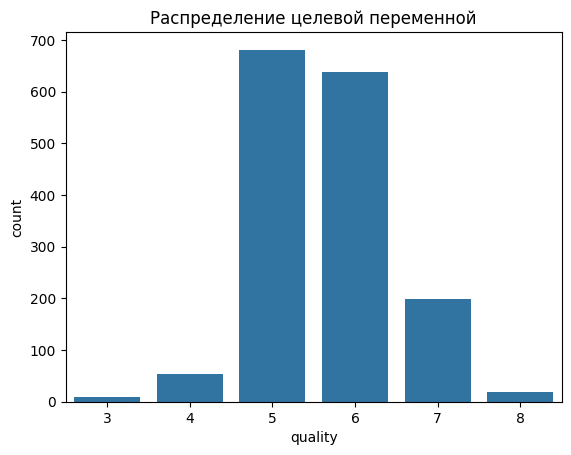

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.countplot(df, x='quality')
plt.title('Распределение целевой переменной')

Text(0.5, 1.0, 'Анализ выбросов')

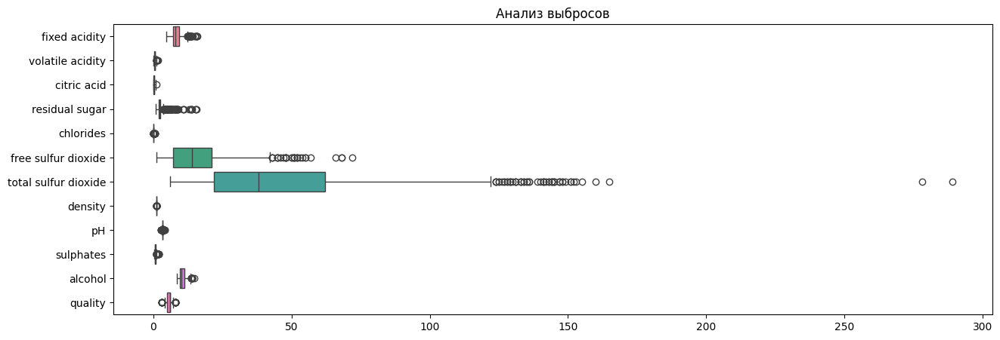

In [7]:
plt.figure(figsize=(15, 5))
sns.boxplot(df, orient='h')
plt.title('Анализ выбросов')

Text(0.5, 1.0, 'Матрица корреляций')

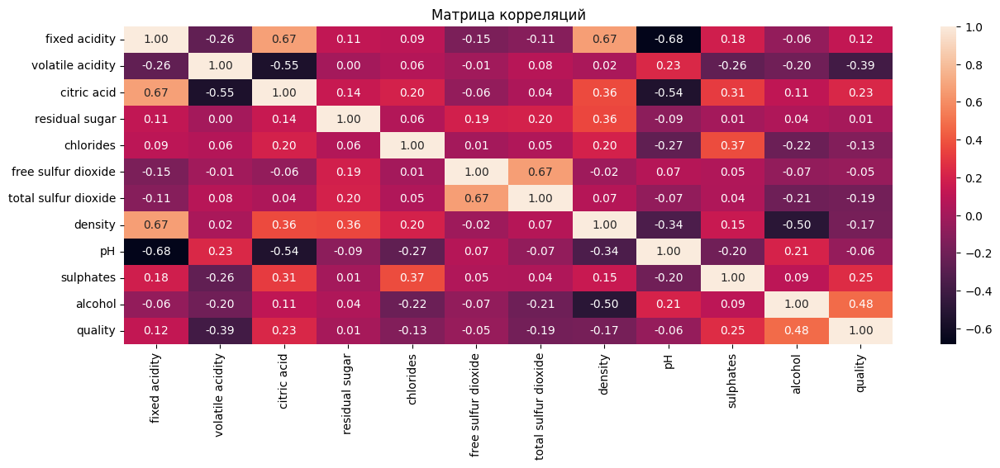

In [8]:
plt.figure(figsize=(15, 5))
sns.heatmap(df.corr(), annot=True,  fmt=".2f")
plt.title('Матрица корреляций')

In [9]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

X = add_constant(df)

vif_df = pd.DataFrame()
vif_df['feature'] = X.columns
vif_df['VIF'] =  [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

vif_df

,feature,VIF
0,const,1.711696e+06
1,fixed acidity,7.772051e+00
2,volatile acidity,1.879663e+00
3,citric acid,3.131055e+00
4,residual sugar,1.703859e+00
5,chlorides,1.500591e+00
6,free sulfur dioxide,1.968010e+00
7,total sulfur dioxide,2.214467e+00
8,density,6.346491e+00
9,pH,3.339511e+00


In [10]:
import numpy as np

print(np.linalg.cond(df.values))

2516.894798145677


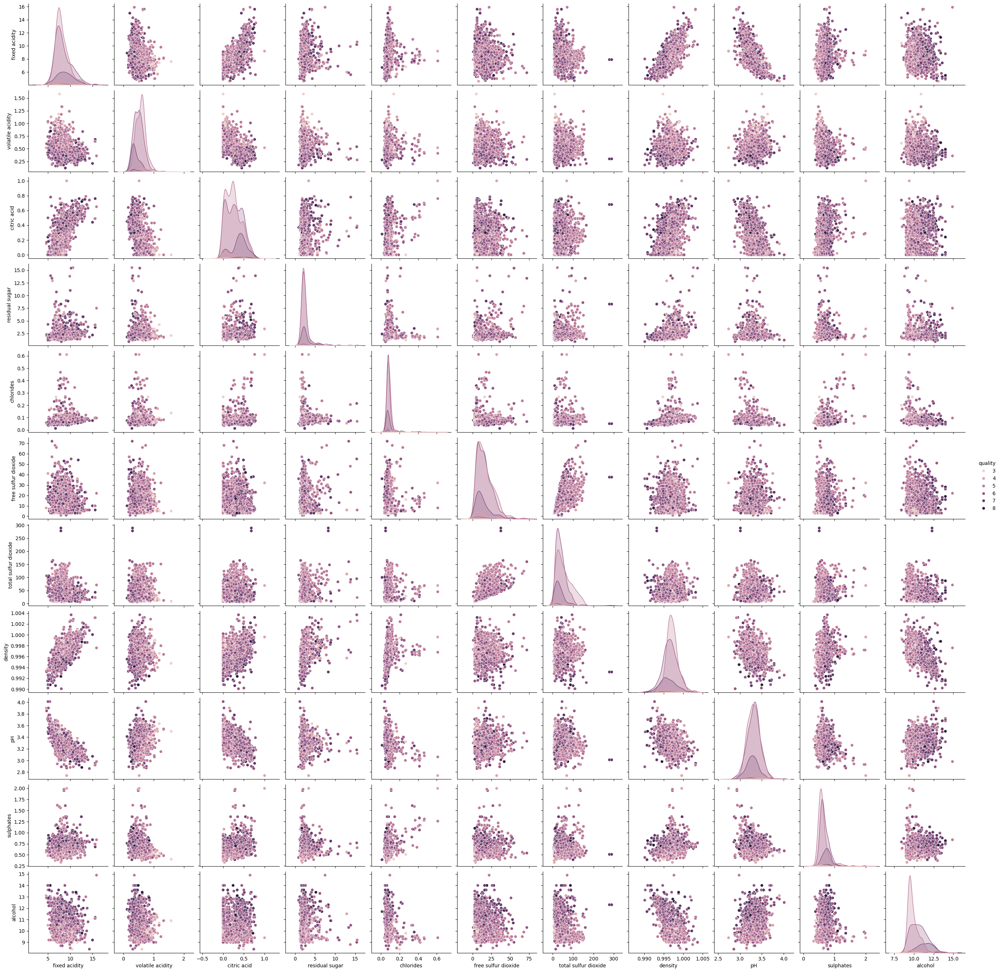

In [11]:
sns.pairplot(df, hue='quality')

# Очистка данных

In [12]:
q1 = df.quantile(0.25)
q3 = df.quantile(0.75)

iqr = q3 - q1

outliers = (df < (q1 - iqr * 1.5)) | (df > (q3 + iqr * 1.5))

Удаление данных

In [13]:
cleaned_df = df[~outliers.any(axis=1)]

Text(0.5, 1.0, 'Распределение целевой переменной')

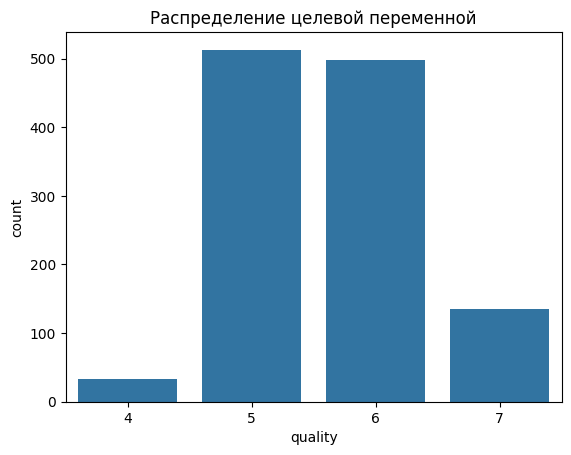

In [14]:
sns.countplot(cleaned_df, x='quality')
plt.title('Распределение целевой переменной')

Text(0.5, 1.0, 'Анализ выбросов')

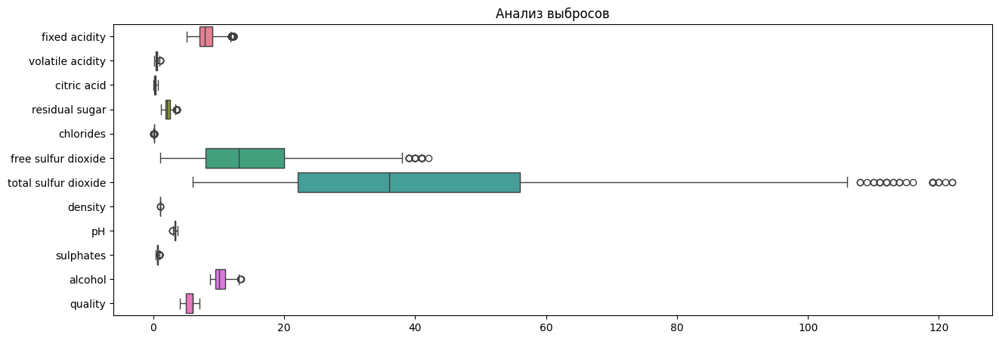

In [15]:
plt.figure(figsize=(15, 5))
sns.boxplot(cleaned_df, orient='h')
plt.title('Анализ выбросов')

Text(0.5, 1.0, 'Матрица корреляций')

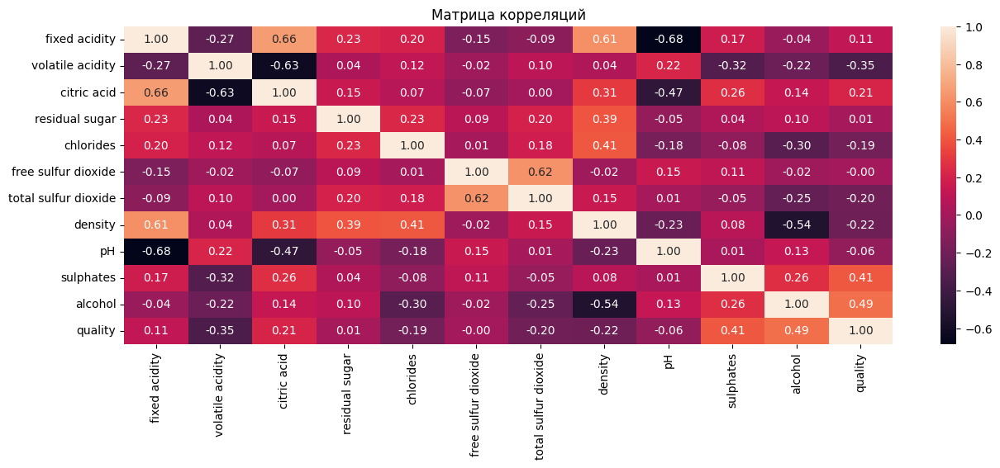

In [16]:
plt.figure(figsize=(15, 5))
sns.heatmap(cleaned_df.corr(), annot=True, fmt=".2f")
plt.title('Матрица корреляций')

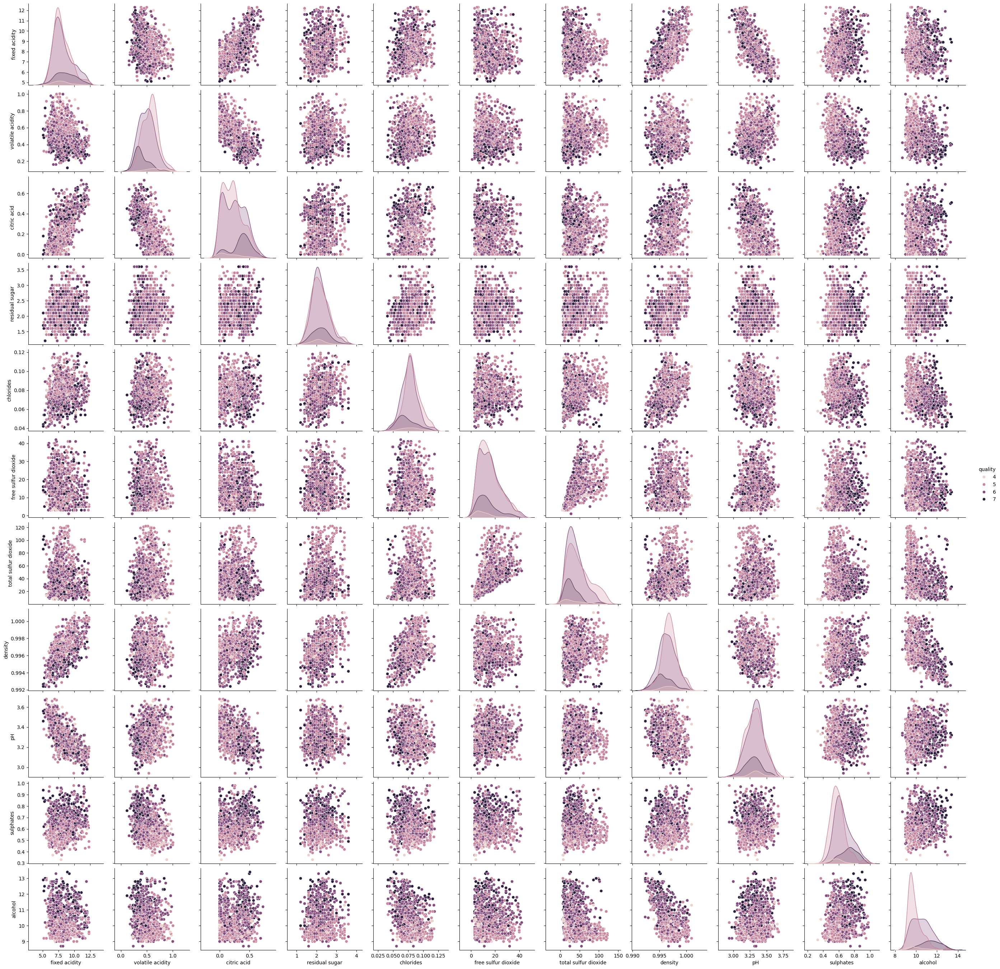

In [17]:
sns.pairplot(cleaned_df, hue='quality')

Mean value

In [24]:
mean_outliers_df = df.mask(outliers, df.mean(), axis=0)

Text(0.5, 1.0, 'Распределение целевой переменной')

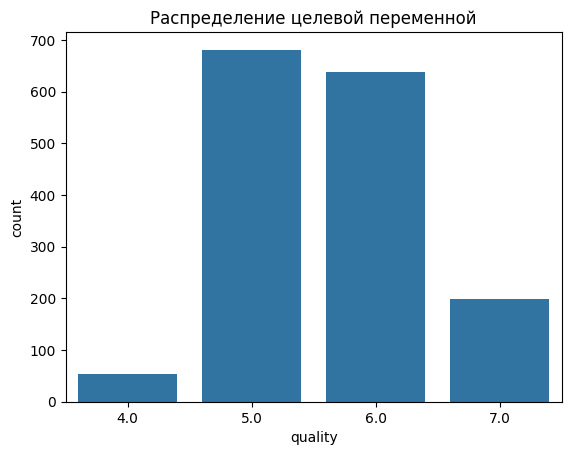

In [25]:
sns.countplot(mean_outliers_df, x='quality')
plt.title('Распределение целевой переменной')

Text(0.5, 1.0, 'Анализ выбросов')

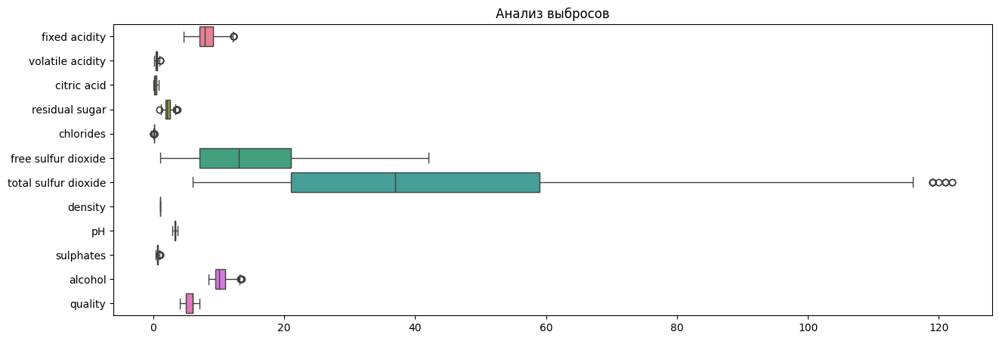

In [26]:
plt.figure(figsize=(15, 5))
sns.boxplot(mean_outliers_df, orient='h')
plt.title('Анализ выбросов')

Text(0.5, 1.0, 'Матрица корреляций')

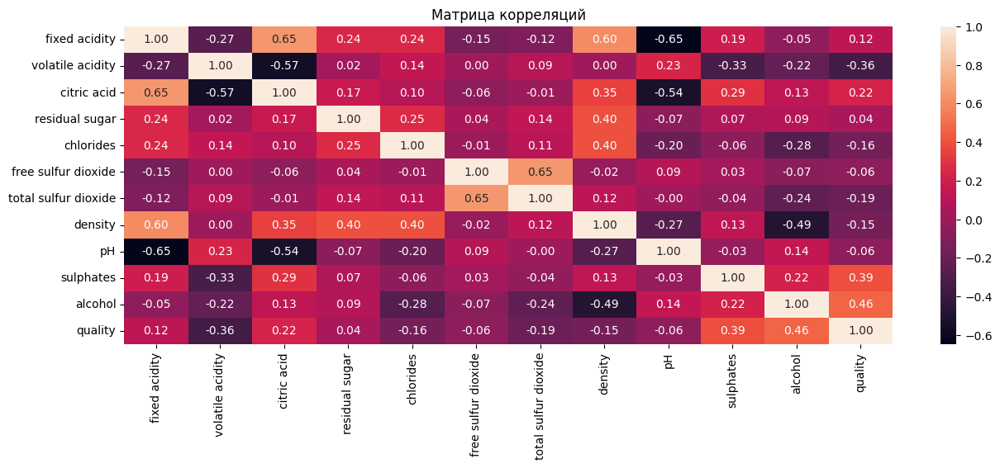

In [27]:
plt.figure(figsize=(15, 5))
sns.heatmap(mean_outliers_df.corr(), annot=True, fmt=".2f")
plt.title('Матрица корреляций')

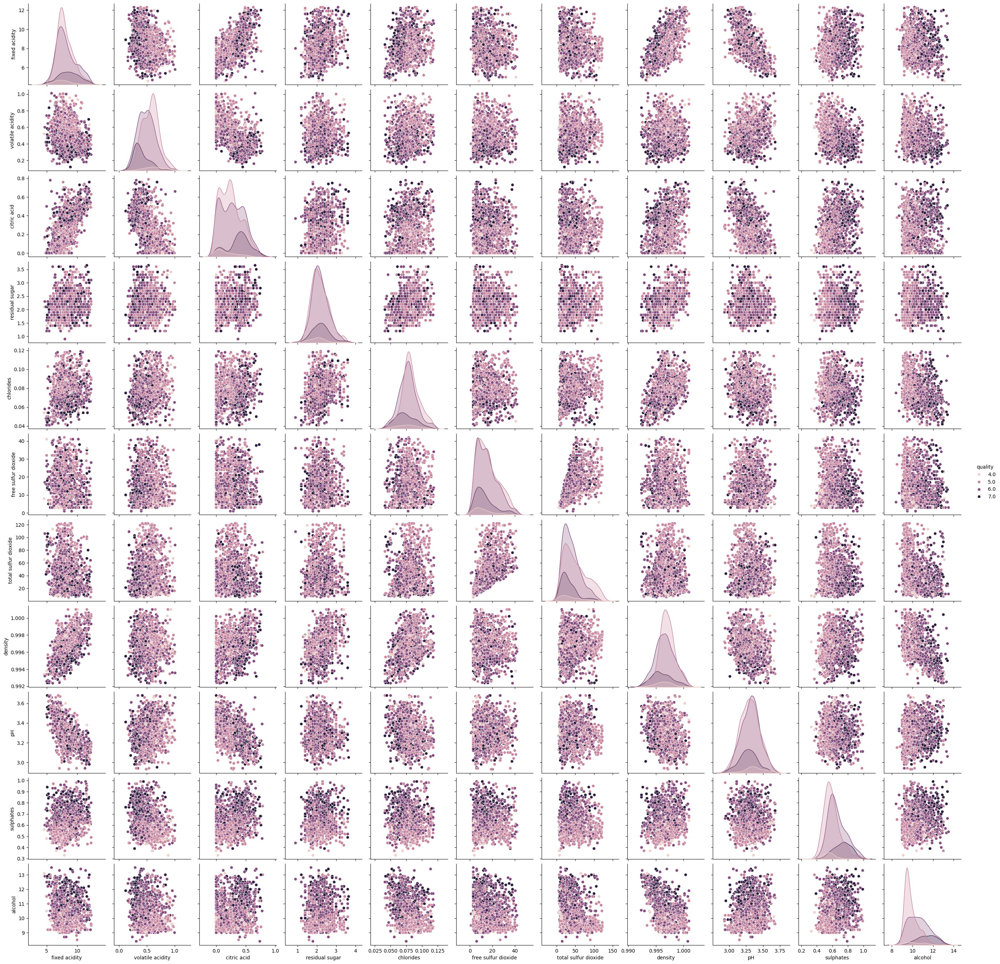

In [28]:
sns.pairplot(mean_outliers_df, hue='quality')